In [1]:
import warnings
warnings.filterwarnings('ignore')

# Prepare the Dataset

In [2]:
dataset_name = 'CIFAR10'

In [3]:
import numpy as np
from skimage.color import grey2rgb
from keras.datasets import cifar10
(X, y), (X_test, y_test) = cifar10.load_data()
X = np.concatenate((X, X_test))
y = np.concatenate((y, y_test)).flatten()
imgs = X
del X_test
del y_test

imgs = X

#X = np.array(list(map(lambda x: grey2rgb(x), X)), dtype=np.float32)
X = X.astype(np.float32)/ 255.0

print('Dataset size {}'.format(X.shape))

Using TensorFlow backend.


Dataset size (60000, 32, 32, 3)


## Dimension Reduction for plotting

In [4]:
from sklearn.decomposition import PCA

In [5]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X.reshape((X.shape[0], -1)))


## Plotting the original data set

In [6]:
import random
randomindexs = list()
for i in range(6000):
    randomindexs.append(random.randint(0,len(X_pca)-1))

In [7]:
from _utils.plots import plot_dataset

In [8]:
labels = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

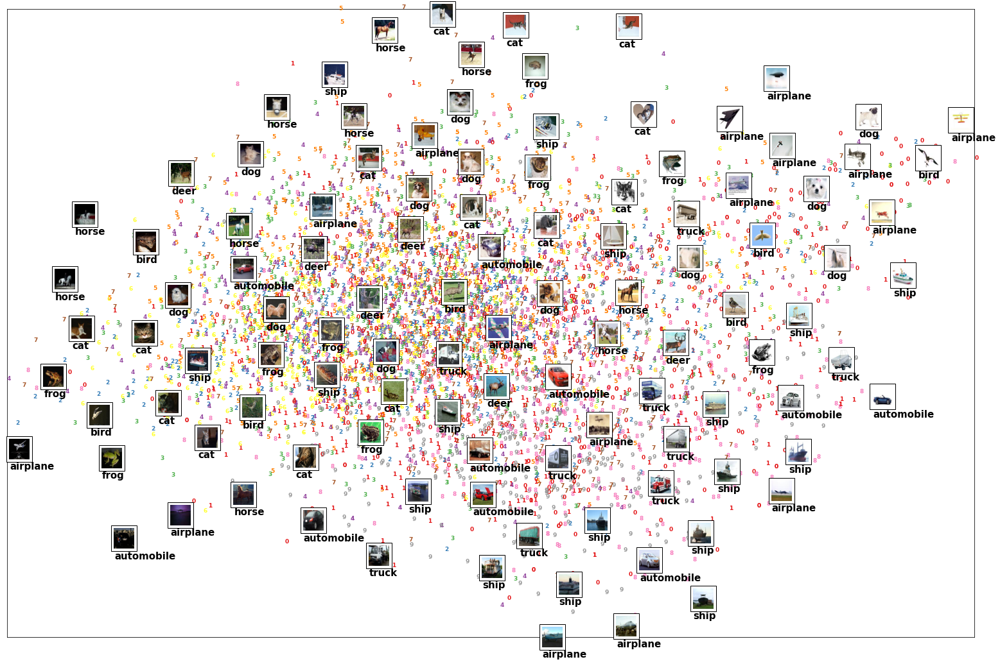

In [9]:
plot_dataset(X_pca[randomindexs], y[randomindexs],images=imgs[randomindexs], labels=labels)

## Linear Separability Analysis

https://scikit-learn.org/stable/modules/generated/sklearn.multiclass.OneVsRestClassifier.html

https://www.cs.waikato.ac.nz/~eibe/pubs/chains.pdf

In [10]:
%load_ext autoreload
%autoreload 2

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("white")

from _utils.plots import plot_transform_hyperplanes

cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0005
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0005


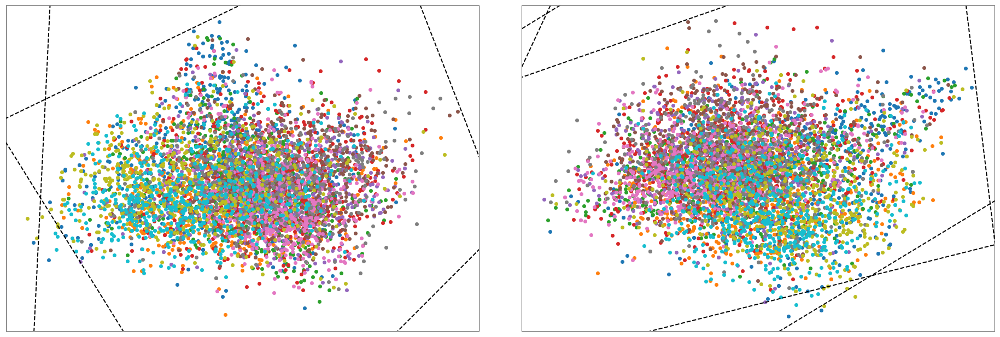

In [12]:
plot_transform_hyperplanes(X_pca[randomindexs], pd.get_dummies(y[randomindexs]).values)

# tSNE embedding transforamtion

https://lvdmaaten.github.io/tsne/

https://github.com/KlugerLab/FIt-SNE

https://github.com/spotify/annoy

http://www.fftw.org/    

In [13]:
from FIt_SNE.fast_tsne import fast_tsne

In [14]:
Z_embedded1 = fast_tsne(X.reshape((X.shape[0], -1)), 
                         learning_rate=1000, max_iter=5000,
                         n_trees=500, perplexity=100,
                         initialization=X_pca, 
                         df=1,
                         early_exag_coeff=15,  
                         late_exag_coeff=5)

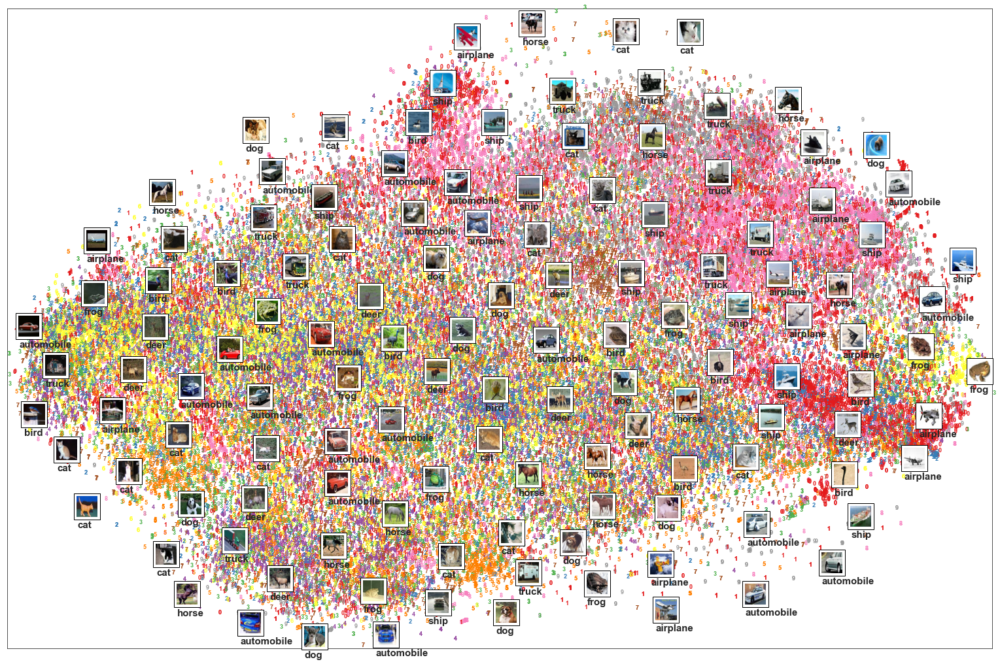

In [15]:
plot_dataset(Z_embedded1, y,images=imgs, labels=labels)

In [16]:
Z_embedded = fast_tsne(X.reshape((X.shape[0], -1)), 
                         learning_rate=1000, max_iter=5000,
                         n_trees=500, perplexity=100,
                         initialization=X_pca, 
                         df=0.4,
                         early_exag_coeff=15,  
                         late_exag_coeff=5)

In [17]:
#Z1 = fast_tsne(X.reshape((X.shape[0], -1)), 
#                         learning_rate=1000,
#                         n_trees=100,
#                         initialization=X_pca, 
#                         df=0.4,
#                         late_exag_coeff=5)
#

#=============== t-SNE v1.1.0 ===============
#fast_tsne data_path: data.dat
#fast_tsne result_path: result.dat
#fast_tsne nthreads: 12
#Read the following parameters:
#########n 60000 by d 3072 dataset, theta 0.500000,
#########perplexity 100.000000, no_dims 2, max_iter 5000,
#########stop_lying_iter 250, mom_switch_iter 250,
#########momentum 0.500000, final_momentum 0.800000,
#########learning_rate 1000.000000, K -1, sigma -1.000000, nbody_algo 2,
##########knn_algo 1, early_exag_coeff 15.000000,
#########no_momentum_during_exag 0, n_trees 500, search_k 150000,
#########start_late_exag_iter -1, late_exag_coeff 5.000000
#########nterms 3, interval_per_integer 1.000000, min_num_intervals 50, t-dist df 0.400000
#Read the 60000 x 3072 data matrix successfully. X[0,0] = 0.231373
#Read the initialization successfully.
#Will use momentum during exaggeration phase
#Computing input similarities...
#Using perplexity, so normalizing input data (to prevent numerical problems)
#Using perplexity, not the manually set kernel width.  K (number of nearest #neighbors) and sigma (bandwidth) parameters are going to be ignored.
#Using ANNOY for knn search, with parameters: n_trees 500 and search_k 150000
#Going to allocate memory. N: 60000, K: 300, N*K = 18000000
#Building Annoy tree...
#Done building tree. Beginning nearest neighbor search...
#parallel (12 threads):
#[===========================================================>] 99% 831.457s
#Symmetrizing...
#Using the given initialization.
#Exaggerating Ps by 15.000000
#Input similarities computed (sparsity = 0.009309)!
#Learning embedding...
#Using FIt-SNE approximation.
#Iteration 50 (50 iterations in 2.63 seconds), cost 4.785700
#Iteration 100 (50 iterations in 2.56 seconds), cost 5.161064
#Iteration 150 (50 iterations in 2.88 seconds), cost 5.275385
#Iteration 200 (50 iterations in 2.67 seconds), cost 5.541113
#Iteration 250 (50 iterations in 2.55 seconds), cost 5.647028
#Unexaggerating Ps by 15.000000
#Iteration 300 (50 iterations in 2.59 seconds), cost 5.040529
#Iteration 350 (50 iterations in 2.66 seconds), cost 4.843579
#Iteration 400 (50 iterations in 2.74 seconds), cost 4.745068
#Iteration 450 (50 iterations in 2.88 seconds), cost 4.678089
#Iteration 500 (50 iterations in 2.74 seconds), cost 4.623371
#Iteration 550 (50 iterations in 2.74 seconds), cost 4.584180
#Iteration 600 (50 iterations in 2.63 seconds), cost 4.548758
#Iteration 650 (50 iterations in 2.57 seconds), cost 4.524492
#Iteration 700 (50 iterations in 2.56 seconds), cost 4.497380
#Iteration 750 (50 iterations in 2.78 seconds), cost 4.475537
#Iteration 800 (50 iterations in 2.77 seconds), cost 4.458605
#Iteration 850 (50 iterations in 2.92 seconds), cost 4.442906
#Iteration 900 (50 iterations in 3.16 seconds), cost 4.427512
#Iteration 950 (50 iterations in 3.40 seconds), cost 4.411601
#Iteration 1000 (50 iterations in 3.82 seconds), cost 4.399673
#Iteration 1050 (50 iterations in 3.59 seconds), cost 4.388867
#Iteration 1100 (50 iterations in 5.01 seconds), cost 4.377666
#Iteration 1150 (50 iterations in 4.43 seconds), cost 4.368059
#Iteration 1200 (50 iterations in 4.33 seconds), cost 4.362032
#Iteration 1250 (50 iterations in 4.11 seconds), cost 4.355230
#Iteration 1300 (50 iterations in 4.07 seconds), cost 4.350845
#Iteration 1350 (50 iterations in 4.70 seconds), cost 4.346587
##Iteration 1400 (50 iterations in 4.87 seconds), cost 4.339765
#Iteration 1450 (50 iterations in 5.18 seconds), cost 4.332093
#Iteration 1500 (50 iterations in 4.85 seconds), cost 4.330610
#Iteration 1550 (50 iterations in 5.17 seconds), cost 4.324316
#Iteration 1600 (50 iterations in 5.37 seconds), cost 4.321232
#Iteration 1650 (50 iterations in 5.46 seconds), cost 4.315741
#Iteration 1700 (50 iterations in 5.61 seconds), cost 4.311007
#Iteration 1750 (50 iterations in 5.71 seconds), cost 4.306920
#Iteration 1800 (50 iterations in 6.41 seconds), cost 4.301409
#Iteration 1850 (50 iterations in 6.41 seconds), cost 4.298832
#Iteration 1900 (50 iterations in 6.50 seconds), cost 4.296838
#Iteration 1950 (50 iterations in 7.13 seconds), cost 4.289403
#Iteration 2000 (50 iterations in 7.09 seconds), cost 4.288043
#Iteration 2050 (50 iterations in 7.11 seconds), cost 4.282334
#Iteration 2100 (50 iterations in 7.19 seconds), cost 4.275738
#Iteration 2150 (50 iterations in 7.95 seconds), cost 4.276523
#Iteration 2200 (50 iterations in 7.95 seconds), cost 4.270471
#Iteration 2250 (50 iterations in 8.06 seconds), cost 4.272880
#Iteration 2300 (50 iterations in 8.54 seconds), cost 4.267555
#Iteration 2350 (50 iterations in 9.60 seconds), cost 4.265986
#Iteration 2400 (50 iterations in 9.56 seconds), cost 4.260527
#Iteration 2450 (50 iterations in 9.61 seconds), cost 4.259225
#Iteration 2500 (50 iterations in 9.48 seconds), cost 4.256411
#Iteration 2550 (50 iterations in 9.44 seconds), cost 4.256409
#Iteration 2600 (50 iterations in 9.45 seconds), cost 4.250119
#Iteration 2650 (50 iterations in 9.43 seconds), cost 4.249105
#Iteration 2700 (50 iterations in 9.48 seconds), cost 4.244543
#Iteration 2750 (50 iterations in 9.41 seconds), cost 4.243168
#Iteration 2800 (50 iterations in 9.86 seconds), cost 4.239430
#Iteration 2850 (50 iterations in 11.82 seconds), cost 4.238312
#Iteration 2900 (50 iterations in 12.29 seconds), cost 4.235823
#Iteration 2950 (50 iterations in 11.79 seconds), cost 4.234284
#Iteration 3000 (50 iterations in 11.63 seconds), cost 4.226576
#Iteration 3050 (50 iterations in 11.31 seconds), cost 4.228590
#Iteration 3100 (50 iterations in 11.60 seconds), cost 4.225354
#Iteration 3150 (50 iterations in 11.45 seconds), cost 4.223695
#Iteration 3200 (50 iterations in 11.35 seconds), cost 4.219280
#Iteration 3250 (50 iterations in 11.36 seconds), cost 4.218133
#Iteration 3300 (50 iterations in 11.12 seconds), cost 4.218862
#Iteration 3350 (50 iterations in 13.51 seconds), cost 4.215324
#Iteration 3400 (50 iterations in 24.52 seconds), cost 4.212618
#Iteration 3450 (50 iterations in 19.90 seconds), cost 4.215601
#Iteration 3500 (50 iterations in 27.22 seconds), cost 4.211822
#Iteration 3550 (50 iterations in 14.73 seconds), cost 4.214605
#Iteration 3600 (50 iterations in 16.48 seconds), cost 4.210201
#Iteration 3650 (50 iterations in 23.20 seconds), cost 4.212420
#Iteration 3700 (50 iterations in 30.22 seconds), cost 4.211044
#Iteration 3750 (50 iterations in 29.64 seconds), cost 4.211196
#Iteration 3800 (50 iterations in 26.36 seconds), cost 4.208577
#Iteration 3850 (50 iterations in 18.54 seconds), cost 4.211066
#Iteration 3900 (50 iterations in 15.28 seconds), cost 4.208351
#Iteration 3950 (50 iterations in 23.28 seconds), cost 4.207341
#Iteration 4000 (50 iterations in 36.23 seconds), cost 4.206819
#Iteration 4050 (50 iterations in 33.85 seconds), cost 4.206127
#Iteration 4100 (50 iterations in 16.84 seconds), cost 4.205256
#Iteration 4150 (50 iterations in 18.39 seconds), cost 4.205552
#Iteration 4200 (50 iterations in 26.61 seconds), cost 4.202578
#Iteration 4250 (50 iterations in 37.06 seconds), cost 4.208126
#Iteration 4300 (50 iterations in 42.54 seconds), cost 4.204048
#Iteration 4350 (50 iterations in 20.18 seconds), cost 4.203642
#Iteration 4400 (50 iterations in 14.26 seconds), cost 4.202805
#Iteration 4450 (50 iterations in 17.75 seconds), cost 4.204936
#Iteration 4500 (50 iterations in 29.64 seconds), cost 4.206159
#Iteration 4550 (50 iterations in 26.81 seconds), cost 4.203474
#Iteration 4600 (50 iterations in 25.58 seconds), cost 4.203188
#Iteration 4650 (50 iterations in 27.12 seconds), cost 4.201320
#Iteration 4700 (50 iterations in 18.46 seconds), cost 4.200294
#Iteration 4750 (50 iterations in 18.32 seconds), cost 4.202292
#Iteration 4800 (50 iterations in 26.58 seconds), cost 4.200084
#Iteration 4850 (50 iterations in 25.72 seconds), cost 4.200299
#Iteration 4900 (50 iterations in 20.43 seconds), cost 4.201077
#Iteration 4950 (50 iterations in 29.73 seconds), cost 4.202830
#Iteration 5000 (50 iterations in 29.47 seconds), cost 4.198926
#Wrote the 60000 x 2 data matrix successfully.
#Done.

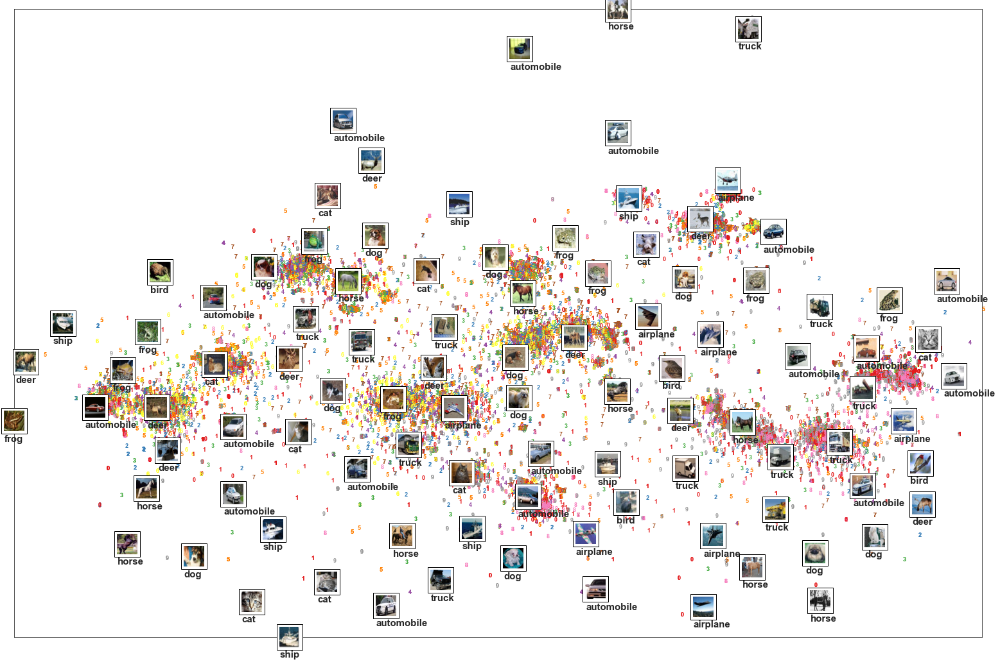

In [18]:
plot_dataset(Z_embedded, y,images=imgs, labels=labels)

https://en.wikipedia.org/wiki/Accuracy_and_precision

https://scikit-learn.org/stable/modules/model_evaluation.html#accuracy-score

https://kite.com/python/docs/sklearn.utils.linear_assignment_.linear_assignment

cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.0


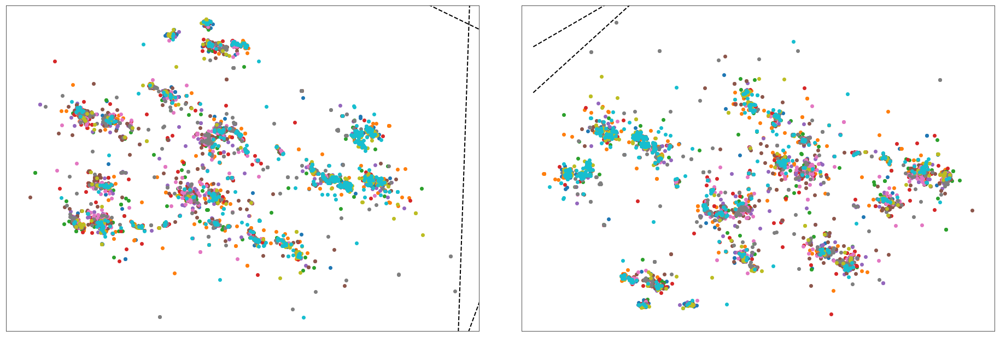

In [19]:
plot_transform_hyperplanes(Z_embedded[randomindexs], pd.get_dummies(y[randomindexs]).values)

In [20]:
from _utils.evaluate import evaluate_clustering 

# Clustering The Z-space

In [21]:
n_clusters = len(np.unique(y[randomindexs]))

In [22]:
# estimate bandwidth for mean shift
from sklearn import cluster, mixture
import hdbscan

from sklearn.neighbors import kneighbors_graph
# connectivity matrix for structured Ward
connectivity = kneighbors_graph(Z_embedded, n_neighbors=n_clusters, include_self=False)
# make connectivity symmetric
connectivity = 0.5 * (connectivity + connectivity.T)

# ============
# Create cluster objects
# ============
two_means = cluster.MiniBatchKMeans(n_clusters=n_clusters)
ward = cluster.AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', connectivity=connectivity)
spectral = cluster.SpectralClustering(n_clusters=n_clusters, eigen_solver='arpack', affinity="nearest_neighbors")
dbscan = cluster.DBSCAN(eps=0.2)
affinity_propagation = cluster.AffinityPropagation()
birch = cluster.Birch(n_clusters=n_clusters)
gmm = mixture.GaussianMixture(n_components=n_clusters, covariance_type='full')
hdbscan_ = hdbscan.HDBSCAN(min_cluster_size=n_clusters, gen_min_span_tree=False)

clustering_algorithms = (
    ('MiniBatchKMeans', two_means),
    ('SpectralClustering', spectral),
    ('Ward', ward),
    ('Birch', birch),
    ('GaussianMixture', gmm),
    ('DBSCAN', dbscan),
    ('HDBSCAN', hdbscan_)
)


## MiniBatch KMeans

In [23]:
import time
for name, algorithm in [clustering_algorithms[0]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting MiniBatchKMeans


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.5250166666666667
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.5242


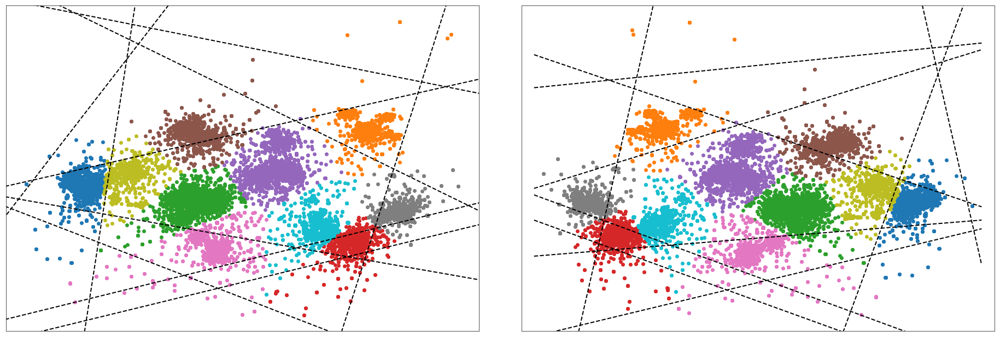

In [24]:
for name, algorithm in [clustering_algorithms[0]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)
    

### Clustering Metrics

In [25]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by MiniBatchKMeans for n_clusters 10
n_clusters orignial 10
n_clusters detected 10
n unclustered points 0 out of 60000
Clustering using MiniBatchKMeans, time elapesd 0.20302629470825195
Clustering Accuracy 0.20768333333333333
Clustering purity 0.23335
Clustering homogeneity 0.08720757864700673
Clustering adjusted_rand_score 0.04564032242362495
Clustering adjusted_mutual_info_score 0.0869398180765629
Clustering completeness_score 0.0888467364662915
Clustering v_measure_score 0.08801952684803857


## Spectral Clustering

In [26]:
import time
for name, algorithm in [clustering_algorithms[1]]:
    t0 = time.time()
    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting SpectralClustering


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.5780833333333333
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.5804166666666667


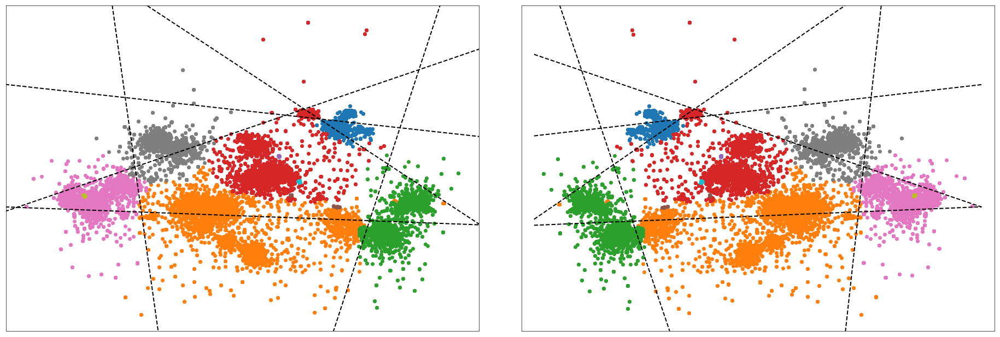

In [27]:
for name, algorithm in [clustering_algorithms[1]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)
    

### Clustering Metrics

In [28]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by SpectralClustering for n_clusters 10
n_clusters orignial 10
n_clusters detected 10
n unclustered points 0 out of 60000
Clustering using SpectralClustering, time elapesd 396.084495306015
Clustering Accuracy 0.19511666666666666
Clustering purity 0.19543333333333332
Clustering homogeneity 0.05781638841958739
Clustering adjusted_rand_score 0.033633350873787375
Clustering adjusted_mutual_info_score 0.05752794034224308
Clustering completeness_score 0.07664051032774175
Clustering v_measure_score 0.06591074991415619


## Ward

In [29]:
import time
for name, algorithm in [clustering_algorithms[2]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting Ward


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.49373333333333336
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.4938166666666667


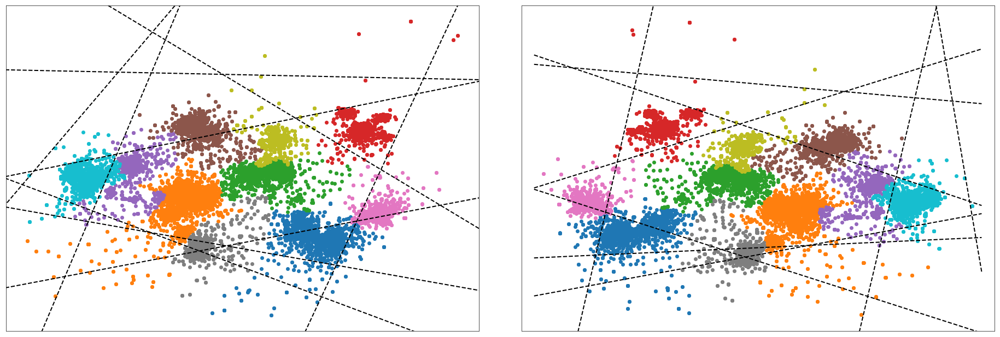

In [30]:
for name, algorithm in [clustering_algorithms[2]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [31]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by Ward for n_clusters 10
n_clusters orignial 10
n_clusters detected 10
n unclustered points 0 out of 60000
Clustering using Ward, time elapesd 4.319486618041992
Clustering Accuracy 0.21576666666666666
Clustering purity 0.22875
Clustering homogeneity 0.08547892917534923
Clustering adjusted_rand_score 0.04683569907249769
Clustering adjusted_mutual_info_score 0.08521065325195717
Clustering completeness_score 0.08801884104003263
Clustering v_measure_score 0.08673029365181126


## Birch

In [32]:
import time
for name, algorithm in [clustering_algorithms[3]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting Birch


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.5846833333333333
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.5843166666666667


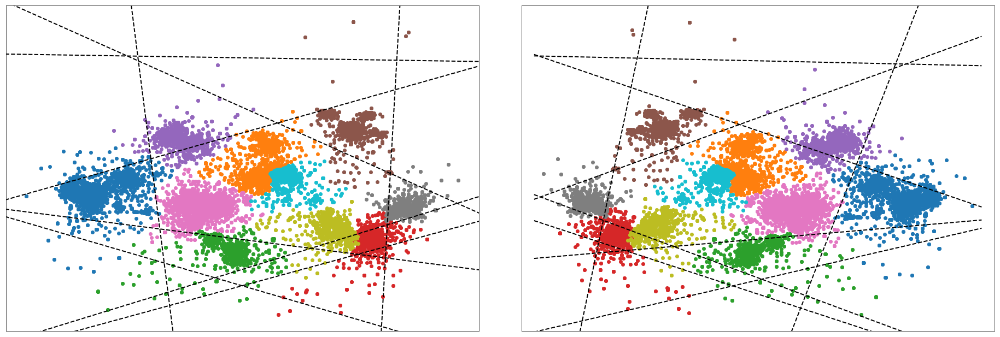

In [33]:
for name, algorithm in [clustering_algorithms[3]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [34]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by Birch for n_clusters 10
n_clusters orignial 10
n_clusters detected 10
n unclustered points 0 out of 60000
Clustering using Birch, time elapesd 3.6542036533355713
Clustering Accuracy 0.20448333333333332
Clustering purity 0.22721666666666668
Clustering homogeneity 0.0873071000027841
Clustering adjusted_rand_score 0.04490022228705245
Clustering adjusted_mutual_info_score 0.08703936610048114
Clustering completeness_score 0.08968773786327637
Clustering v_measure_score 0.08848140875812588


## Gaussian Mixture

In [35]:
import time
for name, algorithm in [clustering_algorithms[4]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting GaussianMixture


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.5101166666666667
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.5111


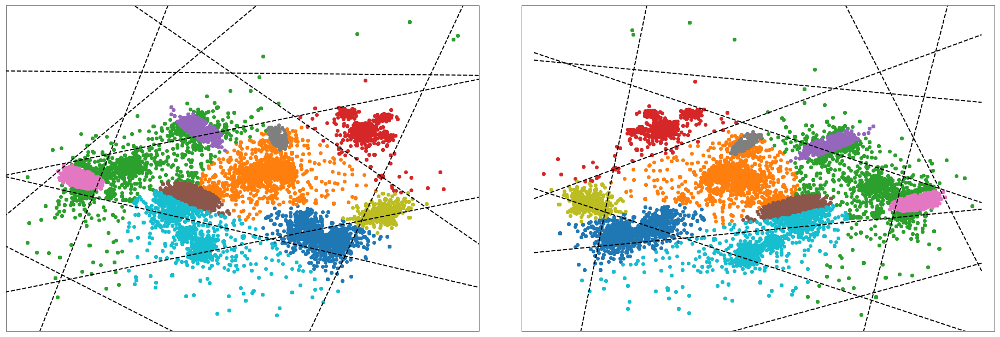

In [36]:
for name, algorithm in [clustering_algorithms[4]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [37]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by GaussianMixture for n_clusters 10
n_clusters orignial 10
n_clusters detected 10
n unclustered points 0 out of 60000
Clustering using GaussianMixture, time elapesd 1.237926721572876
Clustering Accuracy 0.21803333333333333
Clustering purity 0.22786666666666666
Clustering homogeneity 0.08386641276287689
Clustering adjusted_rand_score 0.04715196169324563
Clustering adjusted_mutual_info_score 0.08359766867938526
Clustering completeness_score 0.08549973760003396
Clustering v_measure_score 0.08467519949313765


## DBSCAN

In [38]:
import time
for name, algorithm in [clustering_algorithms[5]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting DBSCAN


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.11443333333333333
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.11983333333333333


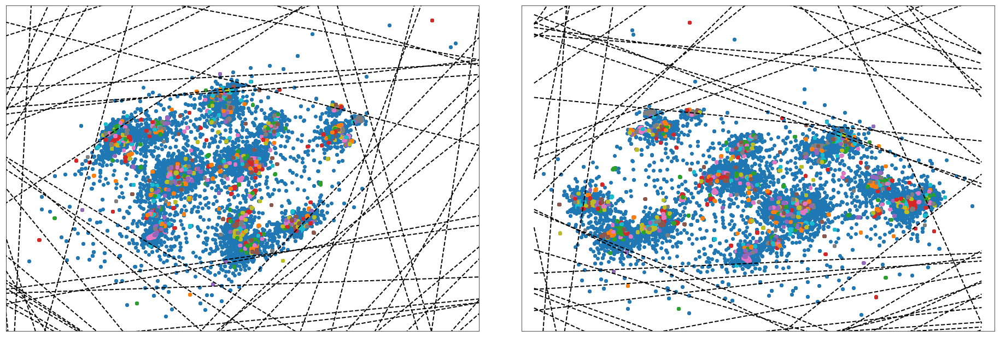

In [39]:
for name, algorithm in [clustering_algorithms[5]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [40]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by DBSCAN for n_clusters 10
n_clusters orignial 10
n_clusters detected 596
n unclustered points 9236 out of 60000
Clustering using DBSCAN, time elapesd 1.1039817333221436
Clustering Accuracy 0.10308486328894492
Clustering purity 0.32755496020802144
Clustering homogeneity 0.19791132732088626
Clustering adjusted_rand_score 0.033760290713125946
Clustering adjusted_mutual_info_score 0.09259313507612991
Clustering completeness_score 0.1047531697626847
Clustering v_measure_score 0.1369955119848671


## HDBSCAN

In [41]:
import time
for name, algorithm in [clustering_algorithms[6]]:
    t0 = time.time()
    
    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting HDBSCAN


C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.15825
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.15995


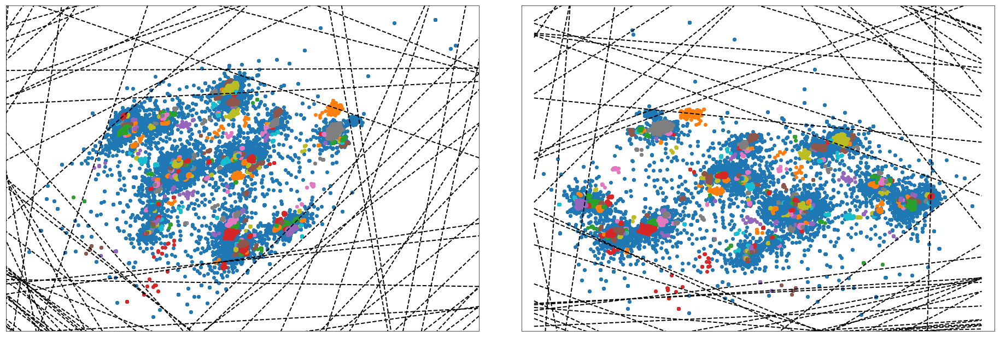

In [42]:
for name, algorithm in [clustering_algorithms[6]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [43]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by HDBSCAN for n_clusters 10
n_clusters orignial 10
n_clusters detected 291
n unclustered points 11094 out of 60000
Clustering using HDBSCAN, time elapesd 3.48838210105896
Clustering Accuracy 0.10906637222426696
Clustering purity 0.3196744775692144
Clustering homogeneity 0.18110747829230497
Clustering adjusted_rand_score 0.03477351544693779
Clustering adjusted_mutual_info_score 0.09221203664234709
Clustering completeness_score 0.0985439135695232
Clustering v_measure_score 0.12763776764214477


# Choose number of clusters equals to Harmonic Mean of STD

In [44]:
from scipy.stats import hmean
n_clusters = int(hmean(X.reshape((X.shape[0], -1)).std(axis=1))*255)

In [45]:

# estimate bandwidth for mean shift
from sklearn import cluster, mixture
import hdbscan

from sklearn.neighbors import kneighbors_graph
# connectivity matrix for structured Ward
connectivity = kneighbors_graph(Z_embedded, n_neighbors=n_clusters, include_self=False)
# make connectivity symmetric
connectivity = 0.5 * (connectivity + connectivity.T)

# ============
# Create cluster objects
# ============
two_means = cluster.MiniBatchKMeans(n_clusters=n_clusters)
ward = cluster.AgglomerativeClustering(n_clusters=n_clusters, linkage='ward', connectivity=connectivity)
spectral = cluster.SpectralClustering(n_clusters=n_clusters, eigen_solver='arpack', affinity="nearest_neighbors")
dbscan = cluster.DBSCAN(eps=0.2)
affinity_propagation = cluster.AffinityPropagation()
birch = cluster.Birch(n_clusters=n_clusters)
gmm = mixture.GaussianMixture(n_components=n_clusters, covariance_type='full')
hdbscan_ = hdbscan.HDBSCAN(min_cluster_size=n_clusters, gen_min_span_tree=False)

clustering_algorithms = (
    ('MiniBatchKMeans', two_means),
    ('SpectralClustering', spectral),
    ('Ward', ward),
    ('Birch', birch),
    ('GaussianMixture', gmm),
    ('DBSCAN', dbscan),
    ('HDBSCAN', hdbscan_)
)


## MiniBatch KMeans

In [46]:
import time
for name, algorithm in [clustering_algorithms[0]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting MiniBatchKMeans


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.16586666666666666
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.1681


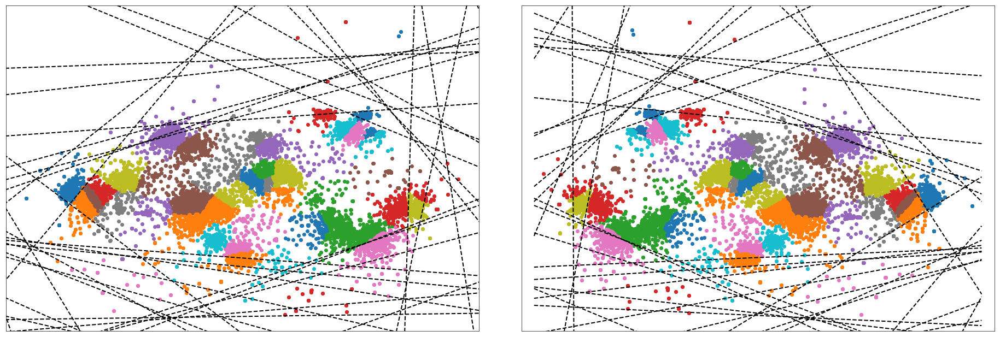

In [47]:
for name, algorithm in [clustering_algorithms[0]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [48]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by MiniBatchKMeans for n_clusters 49
n_clusters orignial 10
n_clusters detected 49
n unclustered points 0 out of 60000
Clustering using MiniBatchKMeans, time elapesd 0.14146709442138672
Clustering Accuracy 0.11441666666666667
Clustering purity 0.2713333333333333
Clustering homogeneity 0.1282089078833779
Clustering adjusted_rand_score 0.033299428900569424
Clustering adjusted_mutual_info_score 0.08150491908235877
Clustering completeness_score 0.08243544322031787
Clustering v_measure_score 0.10034884003090393


## Spectral Clustering

In [49]:
import time
for name, algorithm in [clustering_algorithms[1]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting SpectralClustering


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.12168333333333334
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.12528333333333333


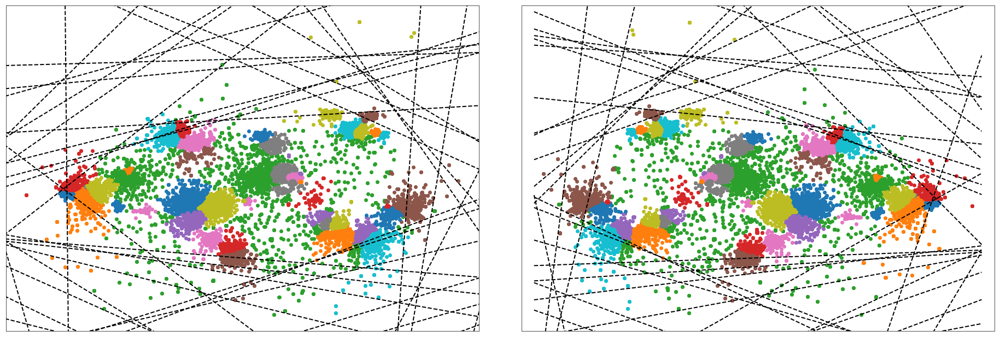

In [50]:
for name, algorithm in [clustering_algorithms[1]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [51]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by SpectralClustering for n_clusters 49
n_clusters orignial 10
n_clusters detected 49
n unclustered points 0 out of 60000
Clustering using SpectralClustering, time elapesd 70.92739200592041
Clustering Accuracy 0.10233333333333333
Clustering purity 0.2712833333333333
Clustering homogeneity 0.1285201769580044
Clustering adjusted_rand_score 0.029564925018209967
Clustering adjusted_mutual_info_score 0.08134492345731638
Clustering completeness_score 0.08227520874006573
Clustering v_measure_score 0.10032500807845533


## Ward

In [52]:
import time
for name, algorithm in [clustering_algorithms[2]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting Ward


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.14716666666666667
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.14775


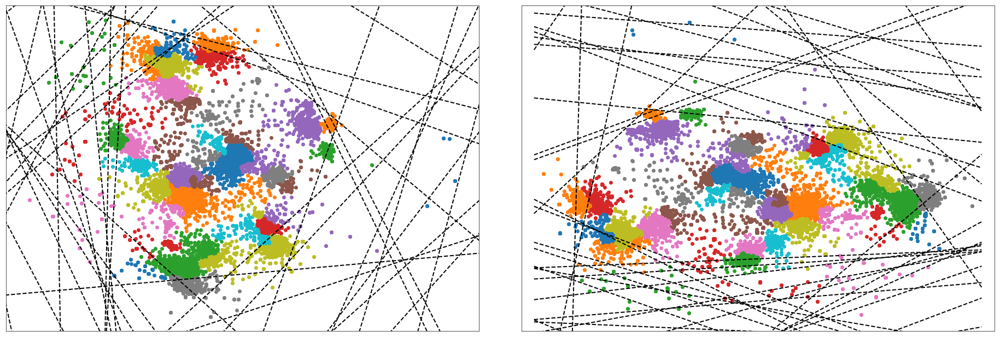

In [53]:
for name, algorithm in [clustering_algorithms[2]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [54]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by Ward for n_clusters 49
n_clusters orignial 10
n_clusters detected 49
n unclustered points 0 out of 60000
Clustering using Ward, time elapesd 18.745686054229736
Clustering Accuracy 0.11161666666666667
Clustering purity 0.2690666666666667
Clustering homogeneity 0.12861250343837732
Clustering adjusted_rand_score 0.03413005848315821
Clustering adjusted_mutual_info_score 0.08351762285788641
Clustering completeness_score 0.08446850241071288
Clustering v_measure_score 0.10196784564107386


## Birch

In [55]:
import time
for name, algorithm in [clustering_algorithms[3]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting Birch


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.15823333333333334
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.15938333333333332


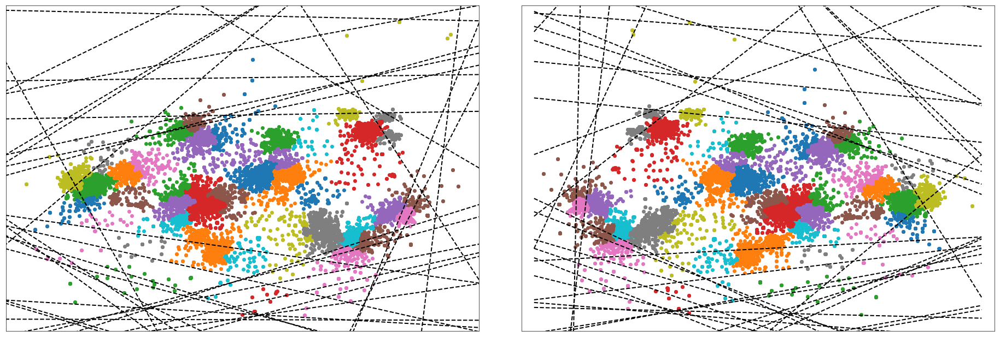

In [56]:
for name, algorithm in [clustering_algorithms[3]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values) 

### Clustering Metrics

In [57]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by Birch for n_clusters 49
n_clusters orignial 10
n_clusters detected 49
n unclustered points 0 out of 60000
Clustering using Birch, time elapesd 3.6325008869171143
Clustering Accuracy 0.1151
Clustering purity 0.2553666666666667
Clustering homogeneity 0.11856182690700559
Clustering adjusted_rand_score 0.032699579261157914
Clustering adjusted_mutual_info_score 0.07904055575287858
Clustering completeness_score 0.08003315559383137
Clustering v_measure_score 0.09556008939246279


## Gaussian Mixture

In [58]:
import time
for name, algorithm in [clustering_algorithms[4]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting GaussianMixture


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.2
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.20178333333333334


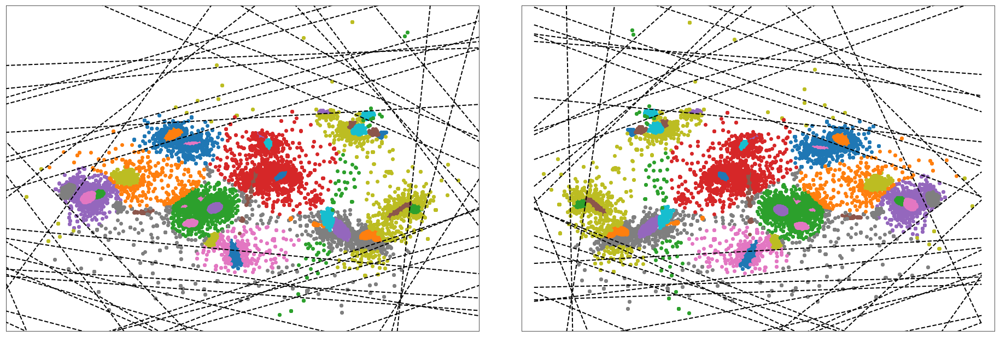

In [59]:
for name, algorithm in [clustering_algorithms[4]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [60]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by GaussianMixture for n_clusters 49
n_clusters orignial 10
n_clusters detected 49
n unclustered points 0 out of 60000
Clustering using GaussianMixture, time elapesd 8.626192569732666
Clustering Accuracy 0.11426666666666667
Clustering purity 0.27076666666666666
Clustering homogeneity 0.13026302204881812
Clustering adjusted_rand_score 0.03288587798325219
Clustering adjusted_mutual_info_score 0.08089334378294288
Clustering completeness_score 0.0817991514526034
Clustering v_measure_score 0.10049321379018746


## DBSCAN

In [61]:
import time
for name, algorithm in [clustering_algorithms[5]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting DBSCAN


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.11443333333333333
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.11983333333333333


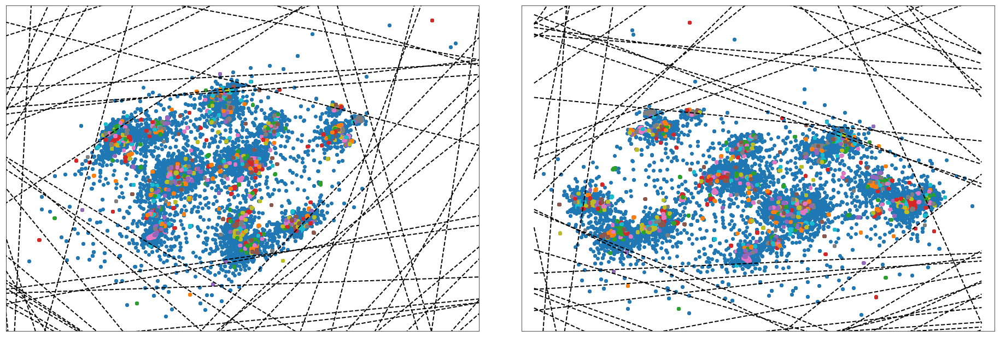

In [62]:
for name, algorithm in [clustering_algorithms[5]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)
    

### Clustering Metrics

In [63]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by DBSCAN for n_clusters 49
n_clusters orignial 10
n_clusters detected 596
n unclustered points 9236 out of 60000
Clustering using DBSCAN, time elapesd 0.39792394638061523
Clustering Accuracy 0.10308486328894492
Clustering purity 0.32755496020802144
Clustering homogeneity 0.19791132732088626
Clustering adjusted_rand_score 0.033760290713125946
Clustering adjusted_mutual_info_score 0.09259313507612991
Clustering completeness_score 0.1047531697626847
Clustering v_measure_score 0.1369955119848671


## HDBSCAN

In [64]:
import time
for name, algorithm in [clustering_algorithms[6]]:
    t0 = time.time()

    print('fitting {}'.format(name))
    algorithm.fit(Z_embedded)

    t1 = time.time()
    algorithm.__dict__['times'] = t1 - t0


fitting HDBSCAN


C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)
C:\ProgramData\Anaconda34\envs\gpu_env\lib\site-packages\sklearn\externals\joblib\parallel.py:268: DeprecationWarning: check_pickle is deprecated in joblib 0.12 and will be removed in 0.13
  ' removed in 0.13', DeprecationWarning)


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.1384
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.13966666666666666


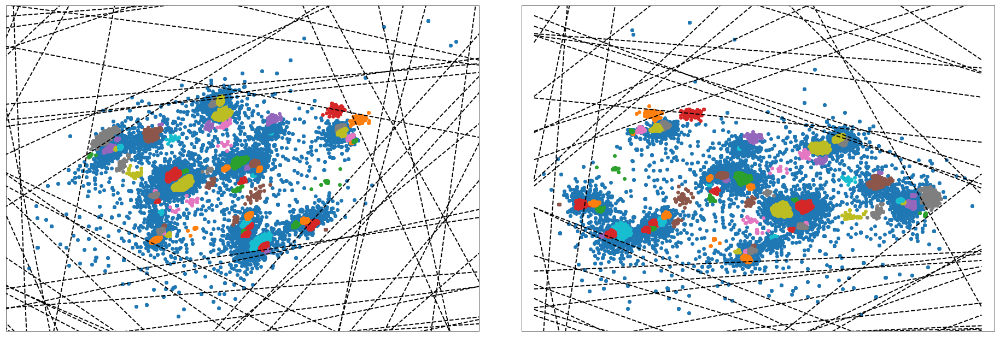

In [65]:
for name, algorithm in [clustering_algorithms[6]]:
    if hasattr(algorithm, 'labels_'):
        y_pred = algorithm.labels_.astype(np.int)
    else:
        y_pred = algorithm.predict(Z_embedded)
        
plot_transform_hyperplanes(Z_embedded, pd.get_dummies(y_pred).values)

### Clustering Metrics

In [66]:
evaluate_clustering(name,n_clusters, y, y_pred, algorithm.__dict__['times'])

clustering by HDBSCAN for n_clusters 49
n_clusters orignial 10
n_clusters detected 74
n unclustered points 9136 out of 60000
Clustering using HDBSCAN, time elapesd 0.9951877593994141
Clustering Accuracy 0.11446209499842717
Clustering purity 0.29740091223655235
Clustering homogeneity 0.1542711603325589
Clustering adjusted_rand_score 0.036855420267074175
Clustering adjusted_mutual_info_score 0.09322770862447423
Clustering completeness_score 0.09479010611673779
Clustering v_measure_score 0.11742797157624284


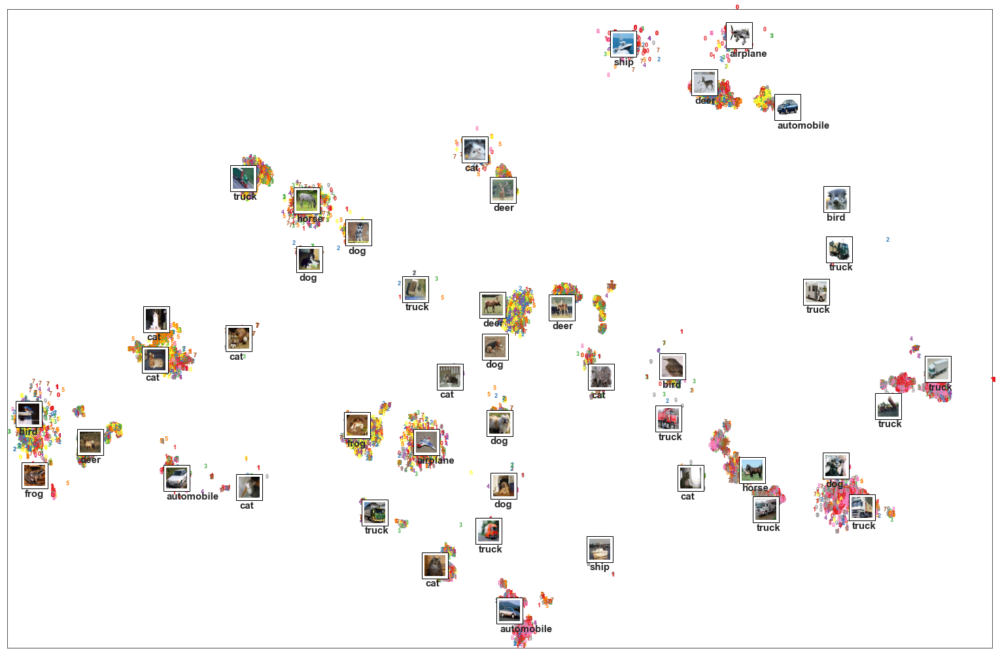

In [67]:
plot_dataset(Z_embedded[y_pred!=-1], y[y_pred!=-1],images=imgs[y_pred!=-1], labels=labels)

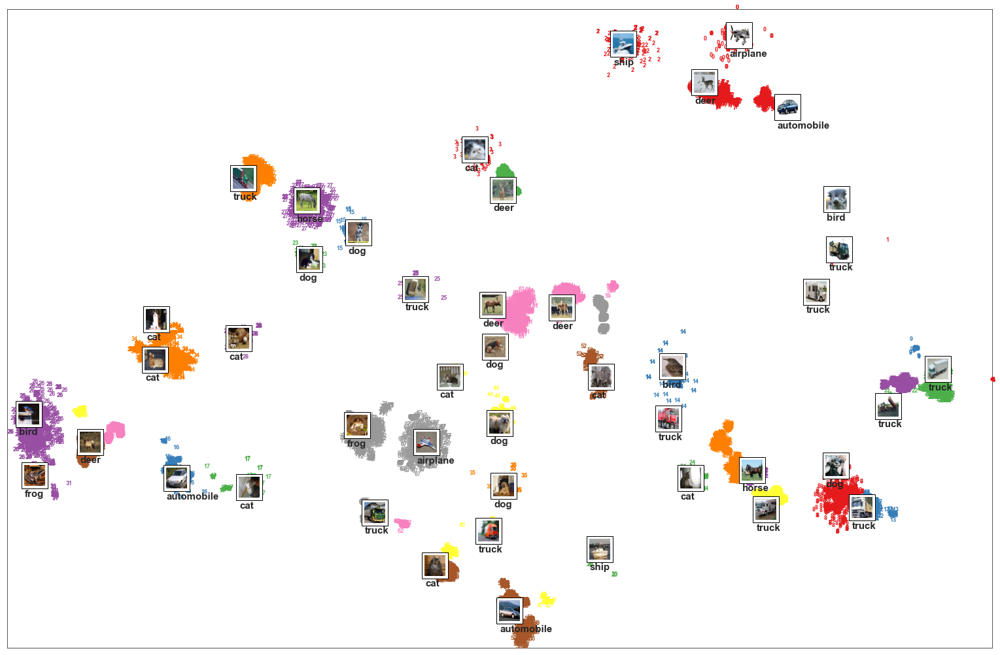

In [69]:
plot_dataset(Z_embedded[y_pred!=-1], y_pred[y_pred!=-1],images=imgs[y_pred!=-1], y_original=y[y_pred!=-1], labels=labels)


cca + OneVsRestClassifier + LogisticRegression accuracy_score 0.19607187794904057
pca + OneVsRestClassifier + LogisticRegression accuracy_score 0.19813620635419943


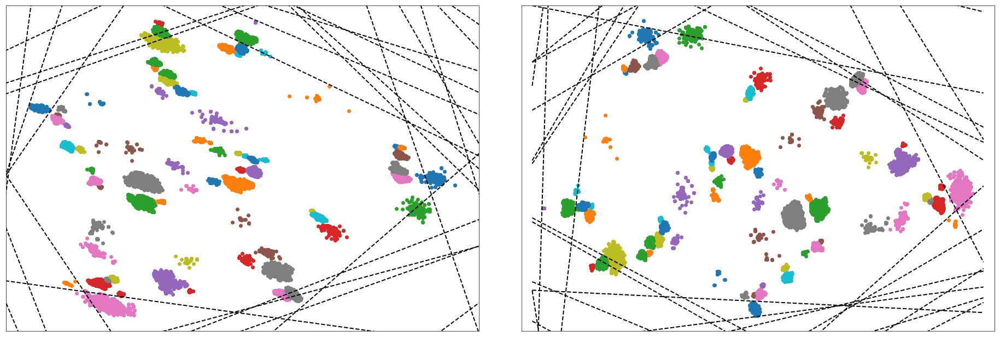

In [70]:
plot_transform_hyperplanes(Z_embedded[y_pred!=-1], pd.get_dummies(y_pred[y_pred!=-1]).values)

In [ ]:
embedding_Z_space = {'X': X[y_pred!=-1], 
                     'Z': Z_embedded[y_pred!=-1], 
                     'y_cluster': y_pred[y_pred!=-1],
                     'y_original': y[y_pred!=-1],
                     'images': imgs[y_pred!=-1],
                     'labels': labels
                    } 

In [ ]:
import pickle
with open('./experiments/manifold generation/{}_{}.pkl'.format(dataset_name, name), 'wb') as f:
    # Pickle the 'data' dictionary using the highest protocol available.
    pickle.dump(embedding_Z_space, f, pickle.HIGHEST_PROTOCOL)
    